In [10]:
import cv2
import numpy as np
from scenedetect import detect, ContentDetector
from sklearn.cluster import KMeans, AgglomerativeClustering
from ultralytics import YOLO
from scipy.stats import entropy
from scipy.cluster.hierarchy import linkage, fcluster
import torch
import matplotlib.pyplot as plt
from torchvision.models import resnet50, ResNet50_Weights
from torchvision import transforms

In [11]:
class ComprehensiveFrameSelector:
    def __init__(self):
        self.detector = YOLO('yolov8x.pt')
        # Initialize ResNet model
        self.resnet = resnet50(weights=ResNet50_Weights.DEFAULT)
        self.resnet.eval()
        if torch.cuda.is_available():
            self.resnet = self.resnet.cuda()
        
        # Remove the final classification layer
        self.feature_extractor = torch.nn.Sequential(*list(self.resnet.children())[:-1])
        
        # Define image transforms
        self.transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                              std=[0.229, 0.224, 0.225])
        ])
        
        self.shopping_classes = [
            # Clothing & Accessories
            'backpack', 'handbag', 'tie', 'suitcase', 'umbrella', 'shoe', 'baseball glove',
            
            # Electronics & Gadgets
            'cell phone', 'laptop', 'mouse', 'remote', 'keyboard', 'tv', 'microwave', 'oven', 'toaster', 'refrigerator',
            
            # Home & Furniture
            'chair', 'couch', 'bed', 'dining table', 'toilet', 'vase', 'clock', 'potted plant', 'sink',
            
            # Kitchen & Dining
            'bottle', 'wine glass', 'cup', 'bowl', 'fork', 'knife', 'spoon', 'banana', 'apple', 'sandwich', 'orange', 
            'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
            
            # Sports & Recreation
            'tennis racket', 'skateboard', 'sports ball', 'frisbee', 'skis', 'snowboard', 'surfboard', 'baseball bat',
            
            # Personal Care
            'toothbrush', 'hair drier', 'scissors',
            
            # Entertainment & Media
            'book', 'kite',
            
            # Transportation
            'bicycle', 'motorcycle'
        ]

    def plot_frames(self, frames, title, scores=None):
        """Helper function to plot frames with optional scores"""
        n_frames = len(frames)
        rows = (n_frames + 4) // 5  # 5 frames per row
        cols = min(5, n_frames)
        
        plt.figure(figsize=(20, 4*rows))
        plt.suptitle(title, fontsize=16)
        
        for i, frame in enumerate(frames):
            plt.subplot(rows, cols, i+1)
            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            if scores is not None:
                plt.title(f'Frame {i+1}\nScore: {scores[i]:.3f}')
            else:
                plt.title(f'Frame {i+1}')
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()

    def calculate_metrics(self, frame):
        """Calculate various quality metrics for a frame"""
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        hist = cv2.calcHist([gray], [0], None, [256], [0, 256])
        hist_norm = hist.ravel() / hist.sum()
        entropy_score = entropy(hist_norm)
        
        edges = cv2.Canny(gray, 100, 200)
        edge_density = np.sum(edges > 0) / (frame.shape[0] * frame.shape[1])
        
        blur_score = cv2.Laplacian(gray, cv2.CV_64F).var()
        
        color_variance = np.mean([np.var(frame[:,:,i]) for i in range(3)])
        
        return {
            'entropy': entropy_score,
            'edge_density': edge_density,
            'blur_score': blur_score,
            'color_variance': color_variance
        }

    def extract_features(self, frame):
        """Extract features using ResNet"""
        # Convert BGR to RGB
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Apply transforms
        img_tensor = self.transform(frame_rgb)
        
        # Add batch dimension
        img_tensor = img_tensor.unsqueeze(0)
        
        if torch.cuda.is_available():
            img_tensor = img_tensor.cuda()
        
        # Extract features
        with torch.no_grad():
            features = self.feature_extractor(img_tensor)
            features = features.squeeze()
            features = features.cpu().numpy().flatten()
        
        return features

    def calculate_complexity_metrics(self, frame):
        """Calculate metrics that indicate frame complexity and amount of content"""
        # Convert to grayscale
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        # 1. Edge density - More edges indicate more objects/details
        edges = cv2.Canny(gray, 100, 200)
        edge_density = np.sum(edges > 0) / (frame.shape[0] * frame.shape[1])
        
        # 2. Color complexity - More unique colors suggest more objects
        reduced_colors = frame // 32 * 32  # Reduce to 8 distinct values per channel
        unique_colors = len(np.unique(reduced_colors.reshape(-1, 3), axis=0))
        color_complexity = unique_colors / (256/32) ** 3  # Normalize by max possible colors
        
        # 3. Local variance - High local variance indicates detailed regions
        kernel_size = 5
        local_mean = cv2.blur(gray, (kernel_size, kernel_size))
        local_var = cv2.blur(gray * gray, (kernel_size, kernel_size)) - local_mean * local_mean
        variance_complexity = np.mean(local_var) / 255
        
        # 4. Region complexity using connected components
        _, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
        num_components, _ = cv2.connectedComponents(binary)
        region_complexity = num_components / (frame.shape[0] * frame.shape[1] / 100)  # Normalize by possible regions
        
        return {
            'edge_density': edge_density,
            'color_complexity': color_complexity,
            'variance_complexity': variance_complexity,
            'region_complexity': region_complexity
        }

    def select_frames(self, video_path, target_frames=20):
        """Select frames using complexity-based metrics and ResNet features"""
        print("Step 1: Detecting scenes...")
        scenes = detect(video_path, ContentDetector(threshold=27))
        
        cap = cv2.VideoCapture(video_path)
        frame_data = []
        
        print("Step 2: Collecting frame data...")
        scene_frames = []
        for scene in scenes:
            scene_start = scene[0].frame_num
            scene_end = scene[1].frame_num
            scene_length = scene_end - scene_start
            
            # Sample more frames initially
            num_samples = min(8, max(2, scene_length // 150))
            
            for i in range(num_samples):
                frame_pos = scene_start + (scene_length * (i + 1)) // (num_samples + 1)
                cap.set(cv2.CAP_PROP_POS_FRAMES, frame_pos)
                ret, frame = cap.read()
                
                if ret:
                    scene_frames.append(frame)
                    complexity_metrics = self.calculate_complexity_metrics(frame)
                    features = self.extract_features(frame)
                    
                    frame_data.append({
                        'frame': frame,
                        'frame_num': frame_pos,
                        'metrics': complexity_metrics,
                        'features': features,
                        'scene_id': len(frame_data)
                    })
        
        print(f"Collected {len(frame_data)} initial frames")
        self.plot_frames(scene_frames, "Step 2: Initial Frames from Scene Detection")
        
        if len(frame_data) > target_frames:
            print("Step 3: Complexity-based pre-selection...")
            # Calculate complexity scores
            complexity_scores = []
            for fd in frame_data:
                metrics = fd['metrics']
                score = (
                    0.35 * metrics['edge_density'] +          # Weight edges heavily as they indicate objects
                    0.25 * metrics['color_complexity'] +      # Different colors suggest different objects
                    0.20 * metrics['variance_complexity'] +   # Local variance indicates detail
                    0.20 * metrics['region_complexity']       # Number of regions suggests number of objects
                )
                complexity_scores.append(score)
            
            self.plot_frames([fd['frame'] for fd in frame_data], 
                        "Step 3: Frames with Complexity Scores",
                        complexity_scores)
            
            # Select top 40 frames based on complexity
            complexity_threshold = sorted(complexity_scores, reverse=True)[min(40, len(complexity_scores)-1)]
            frame_data = [fd for fd, score in zip(frame_data, complexity_scores) 
                        if score >= complexity_threshold]
            
            print("Step 4: Clustering-based selection using ResNet features...")
            features_matrix = np.array([fd['features'] for fd in frame_data])
            linkage_matrix = linkage(features_matrix, method='ward')
            cluster_labels = fcluster(linkage_matrix, t=target_frames, criterion='maxclust')
            
            # Select most complex frame from each cluster
            final_frames = []
            for cluster_id in range(1, target_frames + 1):
                cluster_frames = [fd for fd, label in zip(frame_data, cluster_labels) 
                                if label == cluster_id]
                if cluster_frames:
                    best_frame = max(cluster_frames, 
                                key=lambda x: sum(x['metrics'].values()))  # Sum of complexity metrics
                    final_frames.append(best_frame)
        else:
            print("Step 3: Adding additional frames...")
            final_frames = frame_data.copy()
            
            # Add frames from largest temporal gaps
            while len(final_frames) < target_frames:
                gaps = []
                for i in range(len(final_frames) - 1):
                    gap = final_frames[i+1]['frame_num'] - final_frames[i]['frame_num']
                    gaps.append((gap, i))
                
                largest_gap, gap_index = max(gaps)
                new_frame_pos = final_frames[gap_index]['frame_num'] + largest_gap // 2
                
                cap.set(cv2.CAP_PROP_POS_FRAMES, new_frame_pos)
                ret, frame = cap.read()
                
                if ret:
                    complexity_metrics = self.calculate_complexity_metrics(frame)
                    features = self.extract_features(frame)
                    
                    new_frame_data = {
                        'frame': frame,
                        'frame_num': new_frame_pos,
                        'metrics': complexity_metrics,
                        'features': features,
                        'scene_id': len(final_frames)
                    }
                    
                    final_frames.insert(gap_index + 1, new_frame_data)
        
        # Sort by frame number
        final_frames.sort(key=lambda x: x['frame_num'])
        
        self.plot_frames([f['frame'] for f in final_frames], 
                        "Final Selected Frames")
        
        frames = [f['frame'] for f in final_frames]
        cap.release()
        return frames
        
    def detect_shopping_items(self, frames, conf_threshold=0.3):
        """Detect shopping items in the selected frames"""
        all_detections = []
        
        for frame in frames:
            results = self.detector(frame, conf=conf_threshold)[0]
            
            frame_detections = []
            for det in results.boxes.data:
                class_name = results.names[int(det[-1])]
                if class_name in self.shopping_classes:
                    frame_detections.append({
                        'class': class_name,
                        'confidence': float(det[4]),
                        'bbox': det[:4].tolist()
                    })
            
            all_detections.append(frame_detections)
        
        return all_detections

In [12]:
def process_video(video_path):
    selector = ComprehensiveFrameSelector()
    print("Selecting optimal frames...")
    frames = selector.select_frames(video_path)
    print("Detecting shopping items...")
    detections = selector.detect_shopping_items(frames)
    
    for i, frame_detections in enumerate(detections):
        print(f"\nFrame {i + 1}:")
        for det in frame_detections:
            print(f"Found {det['class']} with {det['confidence']:.2f} confidence")
    
    return frames, detections

In [13]:
def visualize_results(frames, detections):
    """Visualize final results with detected objects"""
    n_frames = len(frames)
    rows = (n_frames + 4) // 5
    cols = min(5, n_frames)
    
    plt.figure(figsize=(20, 4*rows))
    plt.suptitle("Final Results with Object Detection", fontsize=16)
    
    for i, (frame, frame_dets) in enumerate(zip(frames, detections)):
        frame = frame.copy()
        
        for det in frame_dets:
            bbox = det['bbox']
            class_name = det['class']
            confidence = det['confidence']
            
            x1, y1, x2, y2 = map(int, bbox)
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
            label = f"{class_name}: {confidence:.2f}"
            (w, h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)
            cv2.rectangle(frame, (x1, y1-20), (x1 + w, y1), (255, 255, 255), -1)
            cv2.putText(frame, label, (x1, y1-5), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 1)
        
        plt.subplot(rows, cols, i+1)
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.title(f'Frame {i + 1}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

Selecting optimal frames...
Step 1: Detecting scenes...
Step 2: Collecting frame data...
Collected 30 initial frames


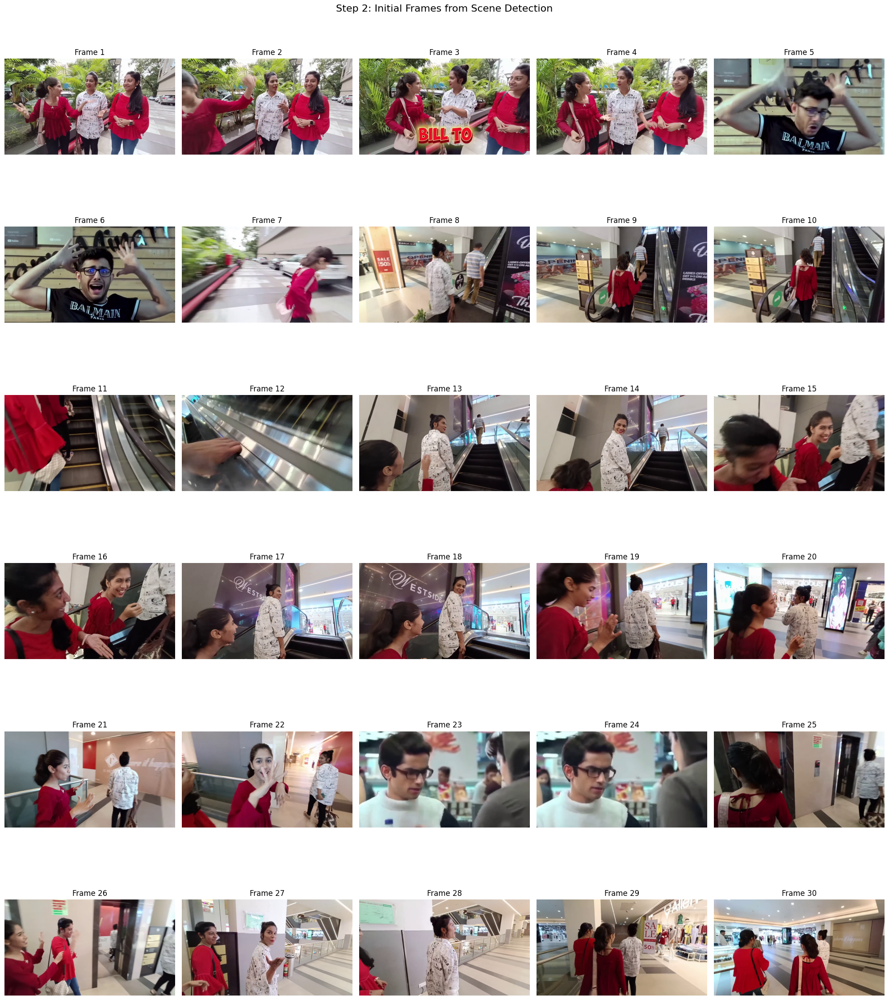

Step 3: Complexity-based pre-selection...


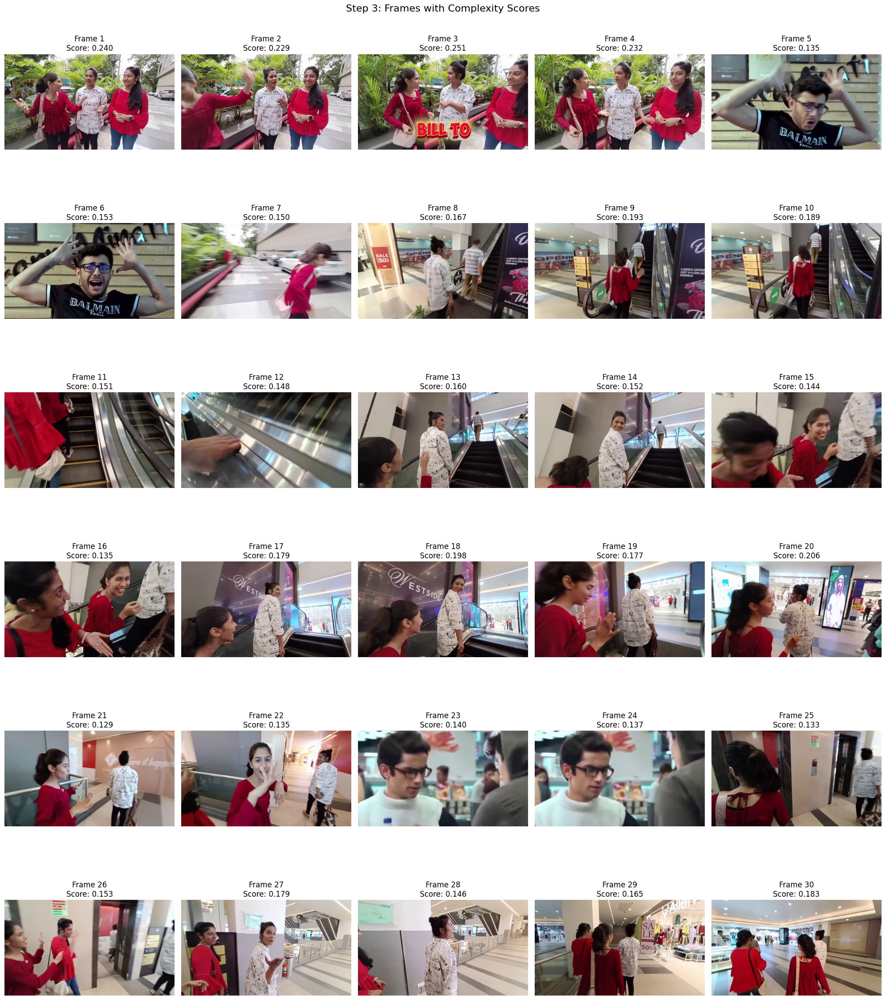

Step 4: Clustering-based selection using ResNet features...


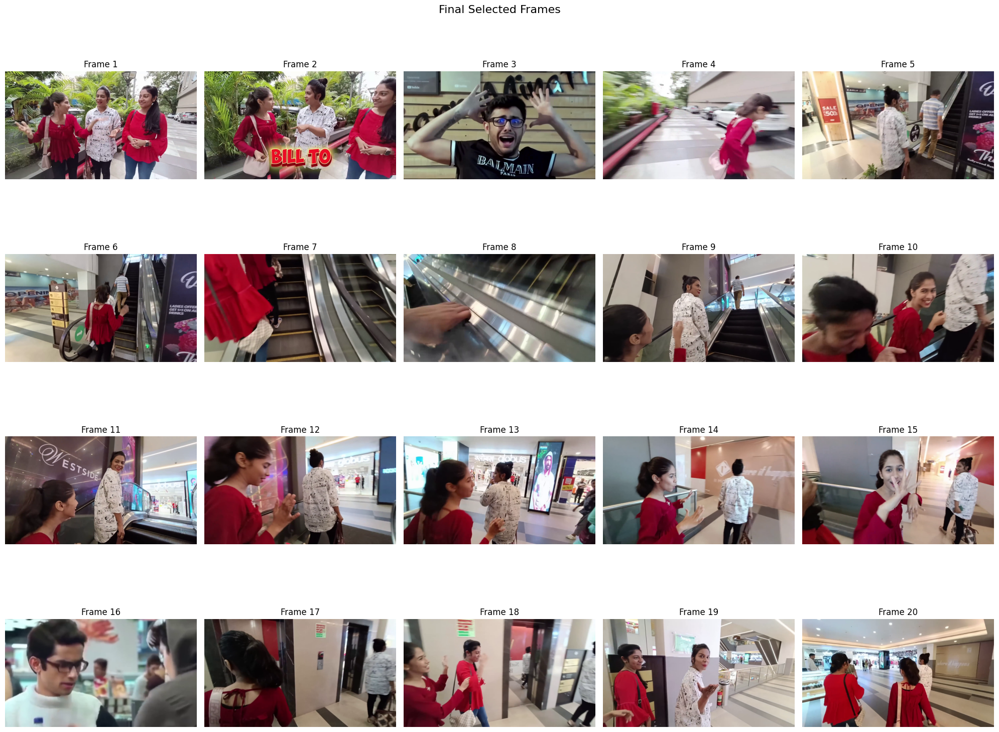

Detecting shopping items...

0: 384x640 8 persons, 3 cars, 3 handbags, 107.1ms
Speed: 3.0ms preprocess, 107.1ms inference, 174.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 persons, 1 stop sign, 2 handbags, 1 potted plant, 41.4ms
Speed: 0.0ms preprocess, 41.4ms inference, 4.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 36.2ms
Speed: 1.0ms preprocess, 36.2ms inference, 2.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 4 cars, 1 handbag, 40.3ms
Speed: 0.0ms preprocess, 40.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 persons, 1 umbrella, 1 potted plant, 34.8ms
Speed: 2.0ms preprocess, 34.8ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 6 persons, 1 handbag, 45.1ms
Speed: 0.0ms preprocess, 45.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 persons, 1 umbrella, 41.3ms
Speed: 0.0ms preprocess, 41.3ms inference, 2.0m

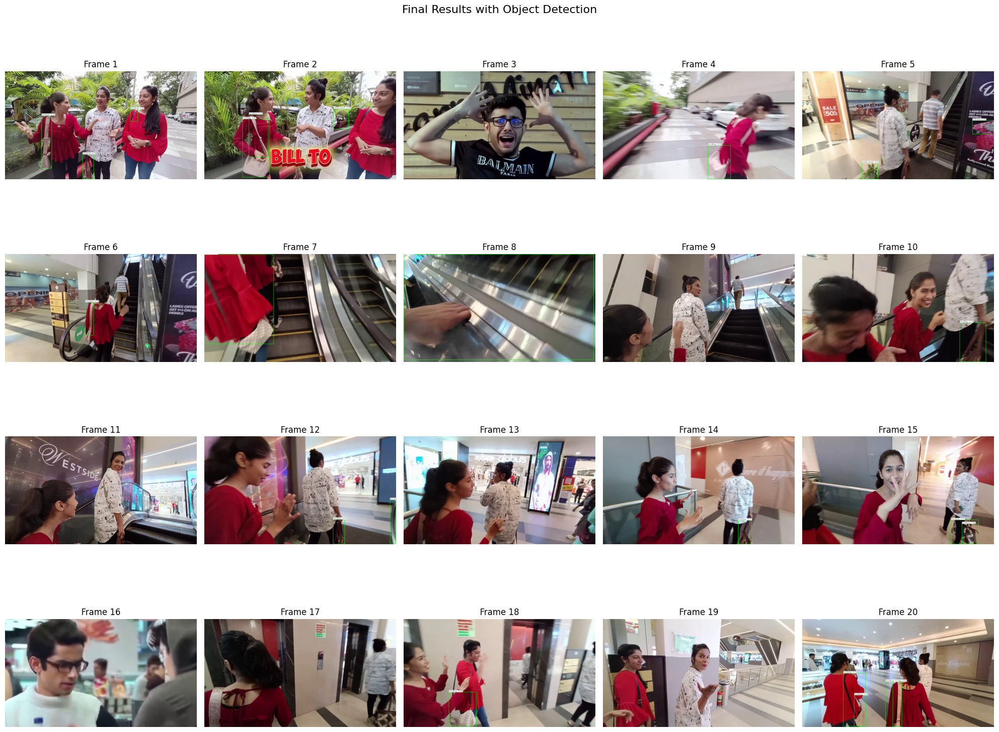

In [14]:
frames, detections = process_video('test.mp4')
visualize_results(frames, detections)